# Интерактивная карта фрактального множества

### Условие задачи

**Дано:**

Варианты фрактальных множеств:

- [фрактал Ляпунова](https://ru.wikipedia.org/wiki/Фрактал_Ляпунова)
  1. AB
  2. BBBBBBAAAAAA
  3. AABAB
  4. ABBBCA

- [множество Жюлиа](https://ru.wikipedia.org/wiki/Множество_Жюлиа)
  5. $z_{n+1} = z^3_n + c$
  6. $z_{n+1} = z^4_n + c$
  7. $z_{n+1} = z^3_n + z^2_n + c$
  8. $z_{n+1} = z^4_n + z^3_n + c$

- [бассейны Ньютона](https://ru.wikipedia.org/wiki/Бассейны_Ньютона)
  9. $p(z) = z^3 - 1$
  10. $p(z) = z^8 + 15z^4 - 16$
  11. $p(z) = z^3 - 2z + 2$
  12. $p(z) = sin(z)$


Обозначим за $\lambda$:
 - количество итераций (множество Жюлиа),
 - количество итераций для достижения заданной погрешности достижения корня (бассейны Ньютона)
 - экспонента Ляпунова (фрактал Ляпунова)

**Требуется**

 - реализовать функции и откомпилировать их при помощи модуля `Numba`:
     - расчет $\lambda$ для точки на комплексной плоскости
     - расчет $\lambda$ на регулярной решетке на комплексной плоскости (эта функция должна быть распараллелена при помощи `prange`)

 - создать интерактивную карту при помощи класса `DynamicMap` модуля `holoviews`:
     - цветом отобразить значение $\lambda$
     - выбрать цветовую карту [colormap](https://matplotlib.org/stable/tutorials/colors/colormaps.html)
     - размеры карты - не менее 600 х 600 точек
     - отрегулировать количество итераций так, чтобы время вычисления одного обновления карты было менее 1 секунды

 - сохранить 5 различных изображений:
     - найти красивые места на карте, применив переносы и масштабирования
     - воспользоваться кнопкой сохранения на интерактивной карте

 - добавить описание:
     - к каждой константе (комментарий)
     - к каждой функции (`docstring`)

**Правила оценивания:**

- оценка за корректно реализованные функции и созданную интерактивную карту `100` баллов

- штрафы $p(i)$, баллов:
    - не работает интерактивная карта - 50
    - ошибки в реализации функций - 20
    - не выполнена компиляция и распараллеливание - 20
    - отсутствует 5 изображений - 20
    - отсутствует `docstring` - 20
    - менее значимые недоработки - 10
    - другие ошибки штрафуются индивидуально в зависимости от их тяжести

- итоговая оценка за задание = $100 - \sum_{i}{p(i)}$

In [2]:
!pip install numpy scipy matplotlib numba sympy joblib tqdm

In [1]:
import numpy as np
import math
from time import time
from numba import njit, prange
import matplotlib.pyplot as plt

In [2]:
def convert_to_array(S):
    '''
    Переводит строковое значение, состоящее из "А" и "В", в numpy массив, состоящий из 0 и 1.
    
            Параметры:
                    S (string): строка, состоящая из "А" и "В"
            Возвращаемое значение:
                    S_arr (numpy.ndarray): numpy массив, состоящий из 0 и 1
    '''
    S_arr = [] 
    for i,k in enumerate(S):
        if k == 'A':
            S_arr.append(0)
        else:
            S_arr.append(1)
    return np.asarray(S_arr)

@njit(fastmath=True)
def limit_func(S, it, x, y):
    '''
    Возвращает приближенное значение экспоненты Ляпунова с заданной точностью, 
    посчитанной для одной точки на заданной последовательности "А","В".
    
            Параметры:
                    S (numpy.ndarray): numpy массив, представляющий собой последовательность "А" и "В", 
                                        состоящий из состоящий 0 и 1, где 0-"А" и 1-"В"
                                        
                    it (int): количество итераций для нахождения экспоненты Ляпунова 
                    x (float): значение координаты точки по оис Х
                    y (float): значение координаты точки по оис Y
                    
            Возвращаемое значение:
                    limit (float): значение экспоненты Ляпунова
    '''
    limit = 0.  #начальное значение предела
    xn = 0.5  #начальное критическое значение для итеративной функции
    for i in range(it):
        if S[i % S.size] == 0:
            rn = x
        else:
            rn = y
        xn = rn * xn * (1 - xn)
        limit += math.log(abs(rn * (1. - 2. * xn)))

    return limit


@njit(parallel=True, fastmath=True)
def lip(S, xmin, xmax, ymin, ymax, nx, ny, it):
    '''
    Возвращает массив размерности nx на ny, содержащий значения экспонены Ляпунова 
    для точек плоскости в диапазонах Х:(xmin,xmax) и Y:(ymin,ymax).
    
            Параметры:
                    S (numpy.ndarray): numpy массив, представляющий собой последовательность "А" и "В", 
                                        состоящий из состоящий 0 и 1, где 0-"А" и 1-"В"
                                        
                    xmin (float): крайнее левое значение по оси Х
                    xmax (float): крайнее правое значение по оси Х
                    ymin (float): крайнее левое значение по оси Y
                    ymax (float): крайнее правое значение по оси Y
                    
                    nx (int): количество точек по оси X
                    ny (int): количество точек по оси Y
                    
                    it (int): количество итераций для нахождения экспоненты Ляпунова 
                    
            Возвращаемое значение:
                    mas (numpy.ndarray): двумерный numpy массив, содержащий значения экспоненты Ляпунова
    '''
    mas = np.zeros((nx, ny), dtype=float)

    dx = (xmax - xmin) / nx
    dy = (ymax - ymin) / ny

    for iy in prange(ny):
        y = ymin + dy * iy
        for ix in range(nx):
            x = xmin + dx * ix
            limit = limit_func(S, it, x, y) / nx
            mas[iy, ix] = limit
    return mas

In [3]:
it = 1000
x = 2
y = 2
S = np.array([0, 1])  # "AB"
limit_func(S, it, x, y)

-inf

In [4]:
#смещение координат на малое число позволяет избажать попадания в критические точки
it = 1000
eps = 1e-6
x = 2 + eps
y = 2 + eps
S = np.array([0, 1])  # "AB"
limit_func(S, it, x, y)

-13815.510557369375

In [5]:
eps = 1e-6 #смещение на малую величину чтобы избежать попаданий в критические точки
xmin, xmax = 0. + eps, 4. + eps #граничные значения по Х
ymin, ymax = 0. + eps, 4. + eps #граничные значения по Y
it = 1000 #колво итераций
S = np.array([0, 1])  # "AB"
S1 = convert_to_array("AB")

0.9489033222198486


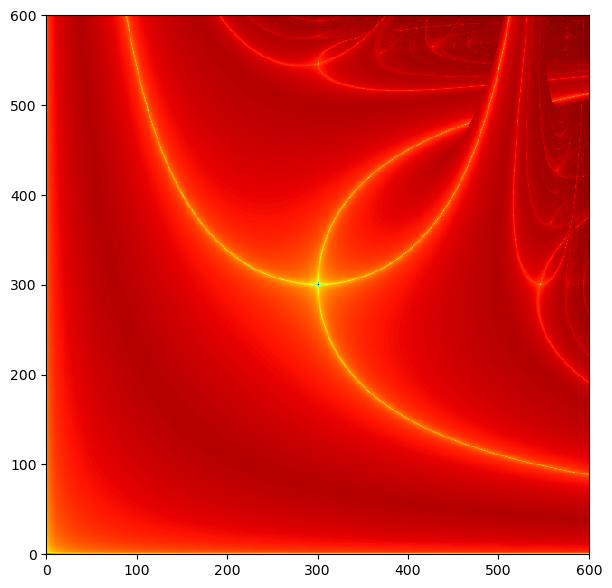

In [7]:
t = time()
arr = lip(S1, xmin, xmax, ymin, ymax, 600, 600, it)
print(time()-t)

plt.figure(figsize=(7,7))
plt.pcolormesh(arr, cmap='jet')
plt.show()

In [8]:
%env HV_DOC_HTML=true

env: HV_DOC_HTML=true


In [9]:
import holoviews as hv

from holoviews import opts
from holoviews.streams import RangeXY



In [12]:
imwidth, imheight = 600, 600
eps = 1e-6
xmin, xmax = 0. + eps, 4. + eps
ymin, ymax = 0. + eps, 4. + eps
it = 1000
#S = np.array([0, 0, 1,0,1]) #AABAB
S = convert_to_array("AB")

def get_fractal(x_range, y_range):
    '''
    Функация вызывается для динамического пересчета цветовой карты в DynamicMap.
    
            Параметры:
                x_range (tuple(float,float)): кортеж хранящий граничные значения для визуализации цветовой карты
                x_range (tuple(float,float)): кортеж хранящий граничные значения для визуализации цветовой карты
                   
                    
            Возвращаемое значение:
                img (holoviews.element.raster.Image): цветовая карта, полученная на переданных значениях
    '''
    
    x0, x1 = x_range
    y0, y1 = y_range
    arr = lip(S, x0, x1, y1, y0, imwidth, imheight, it)
    img = hv.Image(arr, bounds=(x0, y0, x1, y1))
    
    return img

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
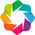

:DynamicMap   []
   :Image   [x,y]   (z)

In [13]:
hv.extension('bokeh')
range_stream = RangeXY(x_range=(xmin, xmax), y_range=(ymin, ymax))
dmap = hv.DynamicMap(get_fractal, streams=[range_stream])

#cmap='plasma',
dmap.opts(opts.Image(cmap='jet',logz=False, 
                     height=imheight, width=imwidth,colorbar=False))

In [14]:
import matplotlib.image as mpimg

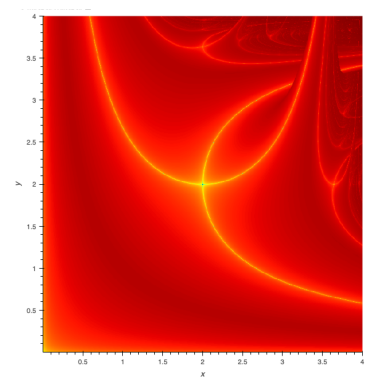

In [15]:
img = mpimg.imread('bokeh_plot.png')
plt.imshow(img)
plt.axis('off')
plt.show()

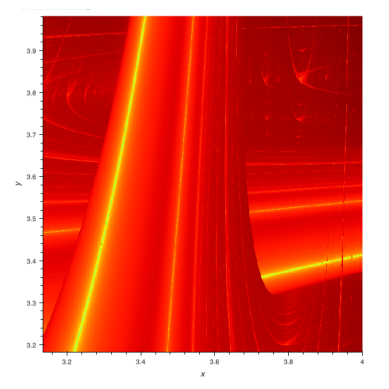

In [16]:
img = mpimg.imread('bokeh_plot1.png')
plt.imshow(img)
plt.axis('off')
plt.show()

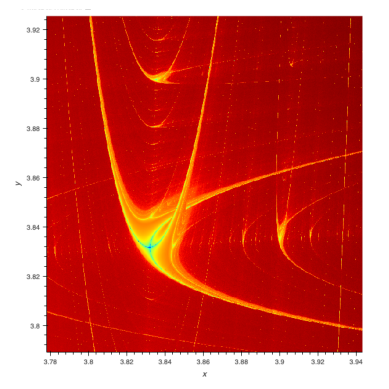

In [17]:
img = mpimg.imread('bokeh_plot2.png')
plt.imshow(img)
plt.axis('off')
plt.show()

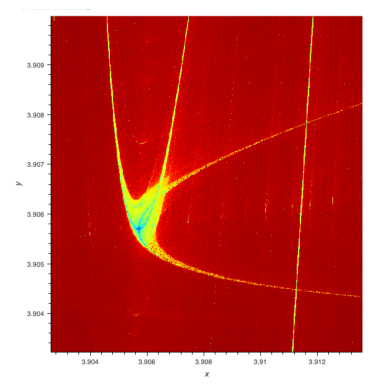

In [18]:
img = mpimg.imread('bokeh_plot3.png')
plt.imshow(img)
plt.axis('off')
plt.show()

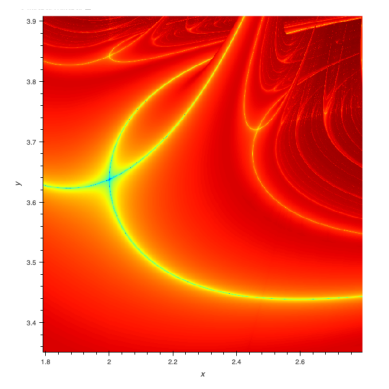

In [19]:
img = mpimg.imread('bokeh_plot4.png')
plt.imshow(img)
plt.axis('off')
plt.show()